# 可視化


In [1]:
import pyrootutils
import os

# find absolute root path (searches for directory containing .project-root file)
# search starts from current file and recursively goes over parent directories
# returns pathlib object
#path = pyrootutils.find_root(search_from=__file__, indicator=".project-root")
#path = pyrootutils.find_root(search_from=os.path.abspath(''), indicator=".project-root")

# find absolute root path (searches for directory containing any of the files on the list)
#path = pyrootutils.find_root(search_from=__file__, indicator=[".git", "setup.cfg"])
root = pyrootutils.find_root(search_from=os.path.abspath(''), indicator=[".github", ".gitignore"])
print("abspath",os.path.abspath(''))
print("root",root)

# take advantage of the pathlib syntax
data_dir = root / "data"
print("data_dir",data_dir)
assert data_dir.exists(), f"path doesn't exist: {data_dir}"

# set root directory
pyrootutils.set_root(
    path=root, # path to the root directory
    project_root_env_var=True, # set the PROJECT_ROOT environment variable to root directory
    dotenv=True, # load environment variables from .env if exists in root directory
    pythonpath=True, # add root directory to the PYTHONPATH (helps with imports)
    cwd=True, # change current working directory to the root directory (helps with filepaths)
)

abspath /Users/tsugumasayutani/Git/My-reserch-Project/notebook
root /Users/tsugumasayutani/Git/My-reserch-Project
data_dir /Users/tsugumasayutani/Git/My-reserch-Project/data


## 必要なライブラリやモジュールの準備

In [2]:
#@title 実行環境選択とスタートアップ { display-mode: "form" }

from enum import Enum

class Mode(Enum):
    jupyter = 1
    colab = 2

mode = Mode.jupyter #@param ["Mode.colab","Mode.jupyter"] {type:"raw"}

if mode == Mode.colab:
    from google.colab import drive #インポート
    drive.mount('/content/gdrive') #GoogleDriveのマウント
    
    !pip install pytorch_lightning --quiet
    !pip install wget --quiet
    !pip install einops --quiet
    #!pip install torch torchaudio --quiet
    #!pip install torch --quiet
    #!pip install librosa --quiet

from pathlib import Path
from typing import Any, Callable, Dict, List, Optional, Tuple
from torch.utils.data import DataLoader, Dataset #追加
#from einops import rearrange

import pytorch_lightning as pl
import torch
import torch.nn as nn
import torch.nn.functional
import torch.optim as optim
import torchvision
import torchaudio
import torchaudio.transforms as T
import torchaudio.functional as F
import gdown
import random
import numpy as np
import os

In [3]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


## 表示関連の関数

In [13]:
#-------------------------------------------------------------------------------
# Preparation of data and helper functions.
#-------------------------------------------------------------------------------
import io
import os
import math
import tarfile
import multiprocessing

import scipy
import librosa
import requests
import matplotlib
import matplotlib.pyplot as plt
from IPython.display import Audio, display


def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None, ylim=None):
  
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].plot(time_axis, waveform[c], linewidth=1)
    axes[c].grid(True)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
    if ylim:
      axes[c].set_ylim(ylim)
  figure.suptitle(title)
  plt.show(block=False)

def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].specgram(waveform[c], Fs=sample_rate)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
  figure.suptitle(title)
  plt.show(block=False)

def play_audio(waveform, sample_rate):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  if num_channels == 1:
    display(Audio(waveform[0], rate=sample_rate))
  elif num_channels == 2:
    display(Audio((waveform[0], waveform[1]), rate=sample_rate))
  else:
    raise ValueError("Waveform with more than 2 channels are not supported.")

def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None): #2Dのデータを表示
  fig, axs = plt.subplots(1, 1) #FigureとAxesを作成
  axs.set_title(title or 'Spectrogram (db)')
  axs.set_ylabel(ylabel)
  axs.set_xlabel('frame')
  im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect) #imshow: 画像出力
  if xmax:
    axs.set_xlim((0, xmax))
  fig.colorbar(im, ax=axs)
  plt.show(block=False)

def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].specgram(waveform[c], Fs=sample_rate)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
        if xlim:
            axes[c].set_xlim(xlim)
    figure.suptitle(title)
    plt.show(block=False)

def model_eval(wav,attrs):
    with torch.no_grad():
        model.eval()
        spec = model(wav.to(model.device),attrs)
        model.train()
    return spec

## Seed値固定

In [14]:
#Seed値
SEED = 42

def torch_fix_seed(seed=42):
    # Python random
    random.seed(seed)
    # Numpy
    np.random.seed(seed)
    # Pytorch
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    #torch.backends.cudnn.deterministic = True

torch_fix_seed(SEED)

## データセットダウンロード

In [15]:
import shutil #zip解凍用

FILENAME = "AKWF_16k_80s"
DOWNLOAD_NAME = FILENAME + ".zip"
DOWNLOAD_PATH = data_dir / DOWNLOAD_NAME
UNPACK_PATH = data_dir
ID = "13-G2TLyQP0XTQlwml0bd423c0meQlI_M"
URL = "https://drive.google.com/uc?id=" + ID

#既にダウンロード済みであったらダウンロードしないように変更
def download_dataset80():
  if os.path.exists(DOWNLOAD_PATH):
  #if os.path.exists(os.path.join(cwd, DOWNLOAD_NAME)):
    print("Already downloaded")
    return
  else: # Datasetダウンロードとunzip
    gdown.download( URL, DOWNLOAD_PATH, quiet=True) #全部で4158個のファイル
    shutil.unpack_archive(DOWNLOAD_PATH, UNPACK_PATH)
    print("Download Complete")

download_dataset80()
NUM_TRAIN = 3158 #trainの数
NUM_VAL = 1000 #valの数

Already downloaded


In [16]:
import shutil #zip解凍用

def download_dataset():

  FILENAME = "AKWF_44k1_600s"
  DOWNLOAD_NAME = FILENAME + ".zip"
  DOWNLOAD_PATH = data_dir / DOWNLOAD_NAME
  UNPACK_PATH = data_dir
  ID = "1i3RJiuAwm9xGcBZ7CWbPT1iTjegEn1Hi"
  URL = "https://drive.google.com/uc?id=" + ID
  NUM_TRAIN = 3158 #trainの数
  NUM_VAL = 1000 #valの数

  #if os.path.exists(os.path.join(cwd, DOWNLOAD_NAME)):
  if os.path.exists(DOWNLOAD_PATH):
    print("Already downloaded")
    return
  else: # Datasetダウンロードとunzip
    gdown.download( URL , DOWNLOAD_PATH , quiet=True) #全部で4158個のファイル
    shutil.unpack_archive(DOWNLOAD_PATH, UNPACK_PATH)
    print("Download Complete")

download_dataset()

Already downloaded


In [24]:
from dataio import DataModule
from dataio import Dataset
from models import VAE4Wavetable
from models.components import Submodule
from models.components import Callbacks

# 箱髭図

In [25]:
def boxplot(points : tuple, ticklabels: tuple): # 箱ひげ図
    fig, ax = plt.subplots(1,1,figsize=(10,5))

    bp = ax.boxplot(points) # 複数指定する場合はタプル型で渡します。
    ax.set_xticklabels(ticklabels)

    plt.title('Audio Extracter')
    plt.grid() # 横線ラインを入れることができます。

    # 描画
    plt.show()

Already downloaded
Loading AKWD data from /home/ubuntu/My-reserch-Project/data/AKWF_44k1_600s
	Found 4158 samples.


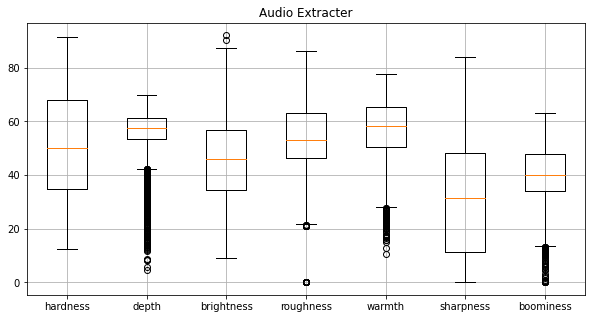

In [26]:
#labelの詳細を可視化
%matplotlib inline 
import matplotlib.pyplot as plt

if mode == Mode.jupyter:
    dataset = Dataset.AKWDDataset(root=f"{UNPACK_PATH}/AKWF_44k1_600s")
elif mode == Mode.colab:
    dataset = Dataset.AKWDDataset(root="/content/AKWF_44k1_600s")

hardness = []
depth = []
brightness = []
roughness = []
warmth = []
sharpness = []
boominess = []

for i in range(len(dataset)):

    audio, attrs = dataset[i]

    hardness.append(attrs["hardness"])
    depth.append(attrs["depth"])
    brightness.append(attrs["brightness"])
    roughness.append(attrs["roughness"])
    warmth.append(attrs["warmth"])
    sharpness.append(attrs["sharpness"])
    boominess.append(attrs["boominess"])

#print(hardness)
#print(depth)

# 点数のタプル
points = (hardness, depth, brightness, roughness, warmth, sharpness, boominess)

# 箱ひげ図
fig, ax = plt.subplots(1,1,figsize=(10,5))

bp = ax.boxplot(points) # 複数指定する場合はタプル型で渡します。
ax.set_xticklabels(["hardness", "depth", "brightness", "roughness", "warmth", "sharpness", "boominess"])

plt.title('Audio Extracter')
plt.grid() # 横線ラインを入れることができます。

# 描画
plt.show()

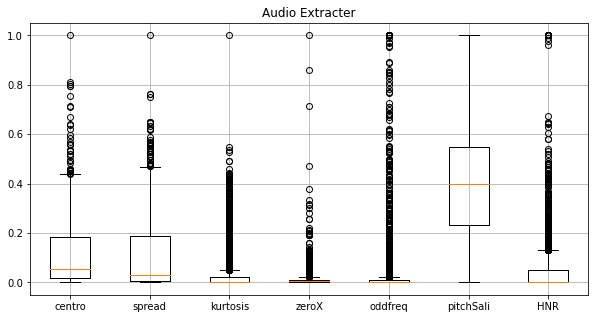

In [27]:
#ラベル確認用。

centro = []
spread = []
kurtosis = []
zeroX = []
specComp = []
oddfreq = []
disso = []
pitchSali = []
HNR = []

for i in range(len(dataset)):

    audio , attrs = dataset[i]
    # append
    centro.append(attrs['SpectralCentroid'])
    spread.append(attrs['SpectralSpread'])
    kurtosis.append(attrs['SpectralKurtosis'])
    zeroX.append(attrs['ZeroCrossingRate'])
    specComp.append(attrs['SpectralComplexity'])
    oddfreq.append(attrs['OddToEvenHarmonicEnergyRatio'])
    disso.append(attrs['Dissonance'])
    pitchSali.append(attrs['PitchSalience'])
    HNR.append(attrs['HNR'])

points = (centro, spread, kurtosis, zeroX, oddfreq, pitchSali, HNR)
ticklabels = ["centro", "spread", "kurtosis", "zeroX", "oddfreq","pitchSali","HNR"]
boxplot(points,ticklabels)

torch.Size([1, 600])
AKWF_0203.wav


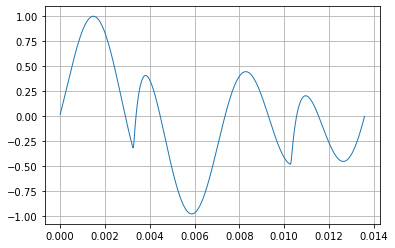

In [28]:
audio , attrs = dataset[0]
print(audio.shape)
print(attrs['name'])

#play_audio(waveform, 44100)
plot_waveform(audio, 44100, title="")
#plot_specgram(waveform,44100)

#### 読み込み

In [29]:
!ls

README.md  data  lightning_logs  notebook  requirements.txt  src
configs    doc	 nohup.out	 plugin    scripts


In [30]:
import pprint
import sys

pprint.pprint(sys.path)

['/home/ubuntu/My-reserch-Project',
 '/home/ubuntu/My-reserch-Project',
 '/home/ubuntu/My-reserch-Project',
 '/home/ubuntu/My-reserch-Project/notebook',
 '/home/ubuntu/anaconda3/lib/python39.zip',
 '/home/ubuntu/anaconda3/lib/python3.9',
 '/home/ubuntu/anaconda3/lib/python3.9/lib-dynload',
 '',
 '/home/ubuntu/anaconda3/lib/python3.9/site-packages',
 '/tmp/tmp57k9g0y8',
 '/home/ubuntu/My-reserch-Project/src/dataio',
 '/home/ubuntu/My-reserch-Project/src']


In [23]:
sys.path.append('/home/ubuntu/My-reserch-Project/src')

In [31]:
dm = DataModule.AWKDDataModule(batch_size=32, data_dir= data_dir/ "AKWF_44k1_600s") 
model = VAE4Wavetable.LitAutoEncoder(sample_points = 600, hidden_dim = 512, embed_dim = 140, beta = 0.1) #44k1 Conv #hidden_dimは使ってない

Already downloaded
Loading AKWD data from /home/ubuntu/My-reserch-Project/data/AKWF_44k1_600s
	Found 4158 samples.
Already downloaded
Loading AKWD data from /home/ubuntu/My-reserch-Project/data/AKWF_44k1_600s
	Found 4158 samples.


In [72]:
#@markdown #### モデルの読み込みをDriveから実施

READ_MODEL_FLG =True #@param {type:"boolean"}

def read_model(path):
    model = torch.load(path)
    #if state_dict:
    #model.load_state_dict(torch.load(path))
    return model

if READ_MODEL_FLG:
    save_path = root / "data/pt"
    name = Path('2022-11-20-02:47:01.797360-LitAutoEncoder-10000epoch-minmax.pt') #@param {type:"string"}
    model_path = save_path / name
    print(model_path)
    model = read_model(model_path)

/home/ubuntu/My-reserch-Project/data/pt/2022-11-19-06:05:09.037962-LitAutoEncoder-10000epoch-yeojohnson.pt


# 4.検証

## TensorBoard

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir ./lightning_logs --bind_all --port 6006

In [ ]:
CHK_BROWSER_FLG =False #@param {type:"boolean"}
if CHK_BROWSER_FLG:
    from google.colab import output
    output.serve_kernel_port_as_window(6006)

In [ ]:
UPLOAD_TENSORBOARD_FLG = False #@param {type:"boolean"}
if UPLOAD_TENSORBOARD_FLG:
    #TensorBoard.dev
    !tensorboard dev upload \
    --logdir ./lightning_logs \
    --name "(optional) My latest experiment" \
    --description "(optional) Simple comparison of several hyperparameters" \
    --one_shot

## 音源の再合成

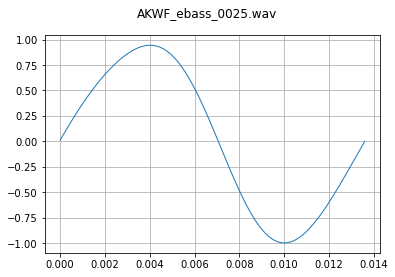

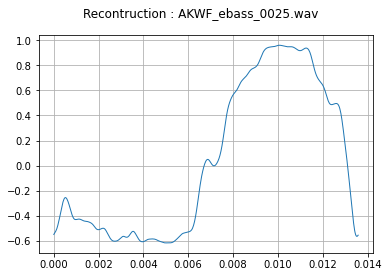

In [73]:
from cgitb import reset

model = model.to(device)

change_random_flg = True #@param {type:"boolean"}
change_brigthness_flg = False #@param {type:"boolean"}
change_rough_flg = False #@param {type:"boolean"}
change_depth_flg = False #@param {type:"boolean"}

reset_attrs_flg = False #@param {type:"boolean"}

cond_brightness = 0 #@param {type:"number"}
cond_rough = 0 #@param {type:"number"}
cond_depth = 100 #@param {type:"number"}

if change_random_flg:
    wavetable, attrs = dm.train_dataset[random.randint(0,len(dm.train_dataset))]
else:
    wavetable, attrs = dm.train_dataset[1]
    if i == 0:
        default_brightness = attrs['brightness']
        print(default_brightness)
        default_rough = attrs['rough']
        print(default_rough)
        default_depth = attrs['depth']
        print(default_depth)
        i = i + 1
    else:
        pass

if reset_attrs_flg:
    attrs['brightness'] = default_brightness
    attrs['rough'] = default_rough
    attrs['depth'] = default_depth

if  change_brigthness_flg:
    print("brightness",attrs['brightness'])
    attrs['brightness'] = cond_brightness
    print("brightness",attrs['brightness'])

if change_rough_flg:
    print("rough",attrs['roughness'])
    attrs['roughness'] = cond_rough
    print("rough",attrs['roughness'])

if change_depth_flg:
    print("depth",attrs['depth'])
    attrs['depth'] = cond_depth
    print("depth",attrs['depth'])

_, _, predict_wavetable = model_eval(wavetable.unsqueeze(0),attrs)
predict_wavetable = predict_wavetable.cpu()
predict_wavetable = predict_wavetable[0]

#print("test2",predict_waveform.shape)

"""
fig, axs = plt.subplots(1,2, figsize=(16,5))
axs[0].pcolor(waveform)
axs[1].pcolor(predict_waveform)
"""

SAMPLE_RATE = 44100
plot_waveform(wavetable, attrs["samplerate"], title=attrs["name"])
#plot_specgram(waveform, SAMPLE_RATE)
#play_audio(waveform, SAMPLE_RATE)

plot_waveform(predict_wavetable, attrs["samplerate"], title="Recontruction : "+ attrs["name"])
#plot_specgram(predict_waveform,SAMPLE_RATE)
#play_audio(predict_waveform, SAMPLE_RATE)

#torch.nn.functional.mse_loss(waveform, predict_waveform), torch.nn.functional.smooth_l1_loss(waveform, predict_waveform), torch.nn.functional.l1_loss(waveform, predict_waveform)


In [2]:
#綺麗に描き直してユーティリティー関数に入れる

def scw_combain(x,duplicate_num=6):

    """波形を6つくっつけてSTFTする関数

    Args:
        x (torch.Tensor): single cycle wavetable
        duplicate_num (int, optional): 何個連結するか設定. Defaults to 6.
    Returns:
        tmp (torch.Tensor): six cycle wavetable
    """

    for i in range(duplicate_num):
        if i == 0:
            tmp = x
        else:
            tmp = torch.cat(tmp, x)

    return tmp

def _scw2spectrum(x,duplicate_num=6):

    """波形を6つくっつけてSTFTする関数

    Args:
        x (torch.Tensor): [description]
        duplicate_num (int, optional): [description]. Defaults to 6.
    Returns:
        tmp (torch.Tensor): [description]
    """

    batch_size = len(x[:])
    for i in range(batch_size):
        single_channel_scw = x[i,:,:] #[32,1,600] -> [1,1,600]

        if i == 0:
            tmp = _scw_combain_spec(single_channel_scw,duplicate_num) #[901,1]
        else:
            tmp = torch.cat([tmp, _scw_combain_spec(single_channel_scw,duplicate_num)]) #[901*i,1]

    #combain_spec = tmp.reshape(batch_size,-1) # [32,901,1]??
    return tmp

def _scw_combain_spec(scw,duplicate_num=6):

    scw = scw.reshape(600) #[1,1,600] -> [600] #あとで直す
    #print("_scw2spectrum3",x.shape)

    for i in range(duplicate_num):
        if i == 0:
            tmp = scw
            #print("1",tmp.shape)
        else:
            tmp = torch.cat([tmp,  scw])
            #print("2",tmp.shape)

    spec_x = _specToDB(tmp.cpu()) # [3600] -> [1801,1]
    #print("test",spec_x.shape)
    return spec_x

def _specToDB(waveform):
    sample_points = len(waveform)
    spec =  torchaudio.transforms.Spectrogram(
                                                       #sample_rate = sample_rate,
                                                       n_fft = sample_points, #時間幅
                                                       hop_length = sample_points, #移動幅
                                                       win_length = sample_points, #窓幅
                                                       center=False,
                                                       pad=0, #no_padding
                                                       window_fn = torch.hann_window,
                                                       normalized=True,
                                                       onesided=True,
                                                       power=2.0)
        
    ToDB =  torchaudio.transforms.AmplitudeToDB(stype = 'power',top_db = 80)

    combain_x = waveform.reshape(1, -1) # [3600] -> [1,3600]
    spec_x = spec(combain_x) # [1,3600] -> [901,1???]
    spec_x = ToDB(spec_x)

    return spec_x

訓練データの波形


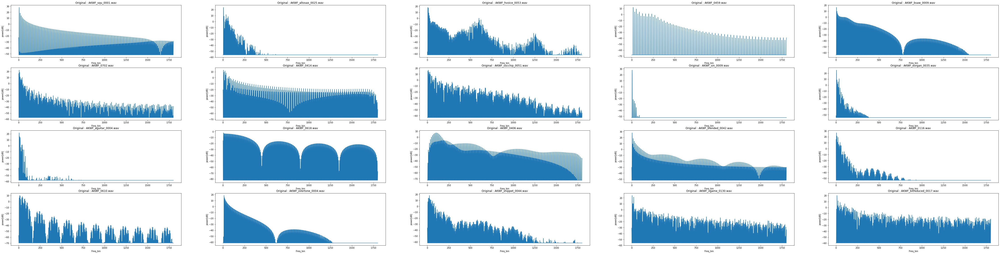

In [75]:
# 訓練データの波形を見る

nrows = 4
ncols = 5

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(nrows*ncols*4,nrows*ncols))
fig.patch.set_facecolor("white")
for i, x in enumerate(dm.train_dataset):
  if i >= nrows*ncols: break
  x, attrs = x
  x = x.unsqueeze(0)
  x = _scw_combain_spec(x)
  x = x.squeeze(0)
  axs[i//ncols, i%ncols].set_title("Original : " + attrs['name'])
  axs[i//ncols, i%ncols].set_xlabel("Freq_bin")
  axs[i//ncols, i%ncols].set_ylabel("power[dB]")
  axs[i//ncols, i%ncols].plot(x)

print("訓練データの波形")
#print(axs)

再構成データのスペクトラム


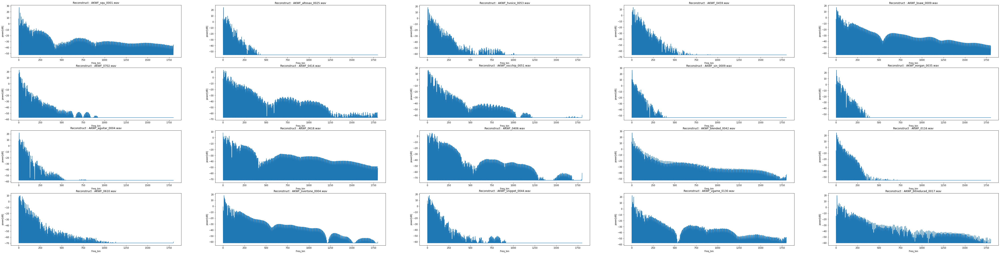

In [76]:
# 再構成したデータの波形を見る
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(nrows*ncols*4,nrows*ncols))
fig.patch.set_facecolor("white")
for i, x in enumerate(dm.train_dataset):
  if i >= nrows*ncols: break
  x, attrs = x
  x = x.unsqueeze(0)
  _, _, predict_waveform = model_eval(x,attrs)
  x = _scw_combain_spec(predict_waveform,6)[0]

  axs[i//ncols, i%ncols].set_title("Reconstruct : " + attrs['name'])
  axs[i//ncols, i%ncols].set_xlabel("Freq_bin")
  axs[i//ncols, i%ncols].set_ylabel("power[dB]")
  axs[i //ncols, i % ncols].plot(x.cpu())

print("再構成データのスペクトラム")

訓練データの波形


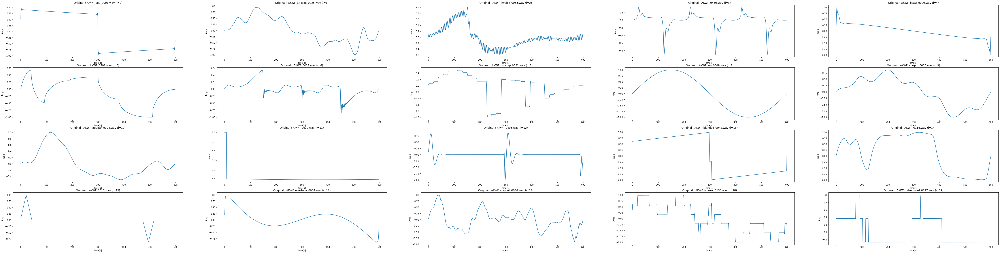

In [77]:
# 訓練データの波形を見る
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(nrows*ncols*4,nrows*ncols))
fig.patch.set_facecolor("white")
for i, x in enumerate(dm.train_dataset):
  if i >= nrows*ncols: break
  x, attrs = x

  axs[i//ncols, i%ncols].set_title("Original : " + attrs['name'] + " (i=" + str(i) + ")")
  axs[i//ncols, i%ncols].set_xlabel("time[s]")
  axs[i//ncols, i%ncols].set_ylabel("Amp")
  axs[i //ncols, i % ncols].plot(x[0])

print("訓練データの波形")
#print(axs)

再構成データの波形


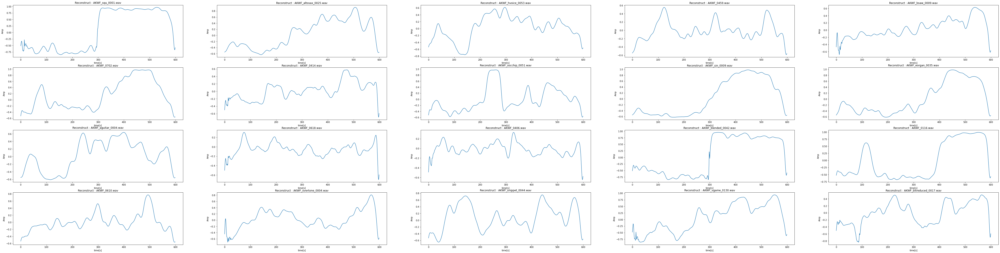

In [78]:
# 再構成したデータの波形を見る
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(nrows*ncols*4,nrows*ncols))
fig.patch.set_facecolor("white")
for i, x in enumerate(dm.train_dataset):
  if i >= nrows*ncols: break
  x, attrs = x 
  unsqueeze_waveform = x.unsqueeze(0)
  _, _, predict_waveform = model_eval(unsqueeze_waveform,attrs)
  predict_waveform = predict_waveform[0,0]
  predict_waveform = predict_waveform.cpu()
  #print(predict_waveform.shape)
  axs[i//ncols, i%ncols].set_title("Reconstruct : " + attrs['name'])
  axs[i//ncols, i%ncols].set_xlabel("time[s]")
  axs[i//ncols, i%ncols].set_ylabel("Amp")
  axs[i // 5, i % 5].plot(predict_waveform)

print("再構成データの波形")

再構成データのスペクトラム


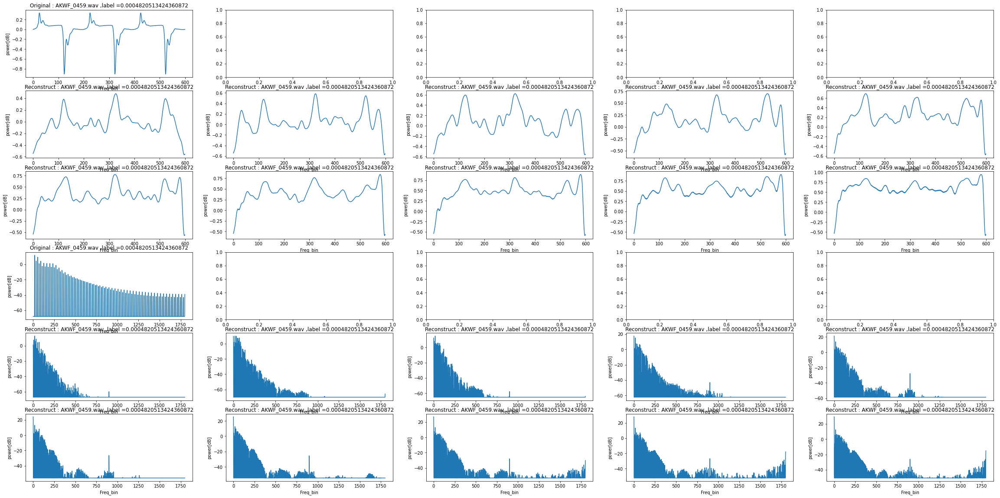

In [86]:
nrows = 4
ncols = 5
idx = 3

def plot_all(x,attrs,i,me):
  axs[i//ncols, i%ncols].set_title( me + " : " + attrs['name'] + " ,label =" + str(attrs['OddToEvenHarmonicEnergyRatio']))
  axs[i//ncols, i%ncols].set_xlabel("Freq_bin")
  axs[i//ncols, i%ncols].set_ylabel("power[dB]")
  axs[i//ncols, i % ncols].plot(x.cpu())


# 再構成した明るさを変えていく
fig, axs = plt.subplots(nrows=nrows+2, ncols=ncols, figsize=(40,20))
fig.patch.set_facecolor("white")
for i in range(10):
  if i >= 10: break
  else:
    if i == 0:
      x, attrs = dm.train_dataset[idx]
      me = "Original"
      plot_all(x[0],attrs,i,me)
      x = _scw_combain_spec(x,6)[0]
      plot_all(x,attrs,i+15,me)

    x, attrs = dm.train_dataset[idx]
    #attrs['brightness'] = (100 / 10) * i
    attrs['Dissonance'] = (1*40 / 10) * i
    me = "Reconstruct"
    x = x.unsqueeze(0)
    _, _, x = model_eval(x,attrs)
    plot_all(x[0,0],attrs,i+5,me)
    x = _scw_combain_spec(x,6)[0]
    plot_all(x,attrs,i+20,me)

print("再構成データのスペクトラム")

## 確認用に簡易的なWavetable Synthを作ろう

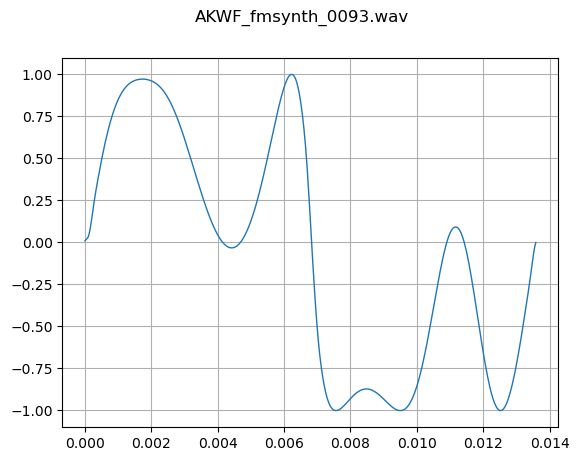

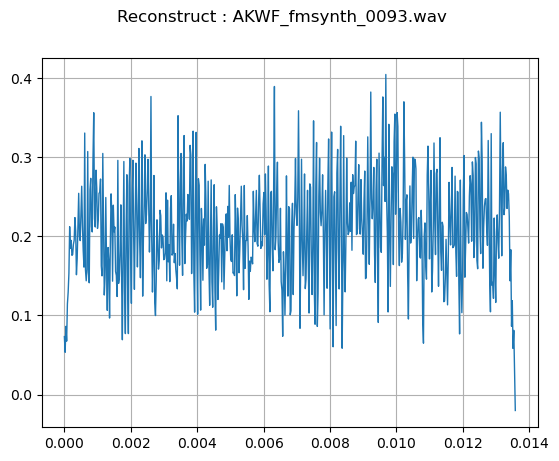

0.25919708299988997


In [52]:
#@title 簡易Wavetable Synth { display-mode: "form" }
import math
from math import tau
import torchaudio
import IPython.display as ipd
import ipywidgets as widgets
from IPython.display import display

sample_rate = 44100 #@param ["8000","11205","16000","22050", "32000","44100", "48000"] {type:"raw"}
duration = 1         #@param {type:"integer"}
frequency = 440   #@param {type:"integer"}
amplitude = 1
start_phase = 0      #@param {type:"slider", min:0, max:1, step:0.1}
change_random_flg = True #@param {type:"boolean"}

if change_random_flg:
    wavetable, attrs = dm.train_dataset[random.randint(0,len(dm.train_dataset))]
    _, _, predict_wavetable = model_eval(wavetable.unsqueeze(0),attrs)
    predict_wavetable = predict_wavetable.cpu()
else:
    pass

def wavetableSynth(wavetable:torch.Tensor, sample_rate:int, duration:int, freaquency:int, amplitude:float, start_phase:float) -> np.ndarray:

    # Reference :https://stackoverflow.com/questions/64415839/making-a-wavetable-synth-for-the-first-time-can-somebody-point-me-in-the-right

    #wavetable, sr = torchaudio.load("sine.flac")
    wavetable = wavetable.reshape(-1)
    # indices for the wavetable values; this is just for `np.interp` to work
    wavetable_period = float(len(wavetable))
    wavetable_indices = np.linspace(0, wavetable_period,
                                    len(wavetable), endpoint=False)

    # frequency of the wavetable played at native resolution
    wavetable_freq = sample_rate / wavetable_period

    # start index into the wavetable
    start_index = start_phase * wavetable_period / tau

    # code above you run just once at initialization of this wavetable ↑
    # code below is run for each audio chunk ↓

    # samples of wavetable per output sample
    shift = frequency / wavetable_freq

    # fractional indices into the wavetable
    indices = np.linspace(start_index, start_index + shift * sample_rate * duration,
                        sample_rate * duration, endpoint=False)

    # linearly interpolated wavetable sampled at our frequency
    audio = np.interp(indices, wavetable_indices, wavetable, period=wavetable_period)
    audio *= amplitude

    sample_count = math.floor(sample_rate * duration)
    # at last, update `start_index` for the next chunk
    start_index += shift * sample_count

    audio = audio.reshape(1,-1)
    return audio

import time

start = time.perf_counter()

#print("入力データ")
plot_waveform(wavetable, attrs["samplerate"], title=attrs["name"])
audio = wavetableSynth(wavetable, sample_rate, duration, frequency, amplitude, start_phase)
display(Audio(audio, rate=sample_rate))

#print("再構成データ")
plot_waveform(predict_wavetable[0], attrs["samplerate"], title="Reconstruct : " + attrs["name"])
predict_audio = wavetableSynth(predict_wavetable, sample_rate, duration, frequency, amplitude, start_phase)
display(Audio(predict_audio, rate=sample_rate))

print(time.perf_counter() - start)


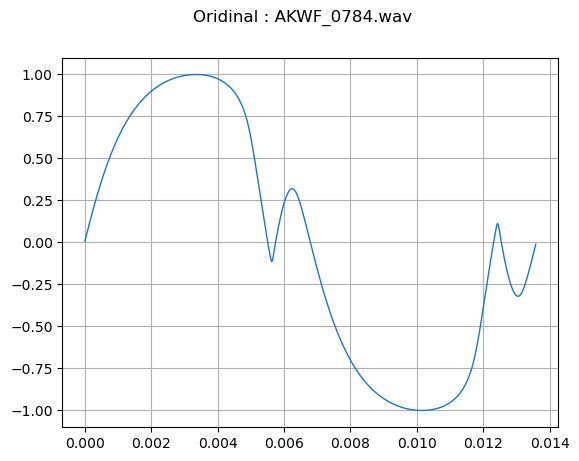

default_brightness 41.812464663505786
0


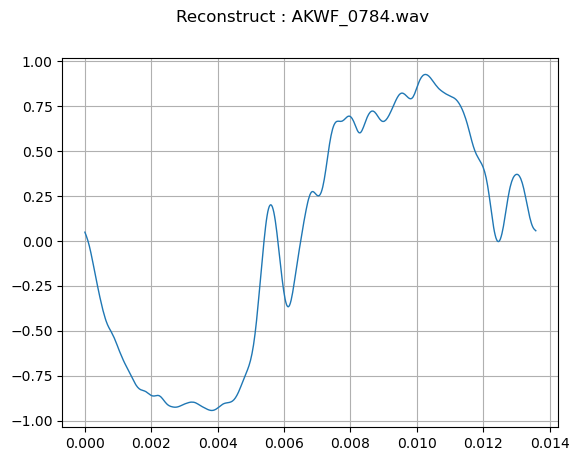

20


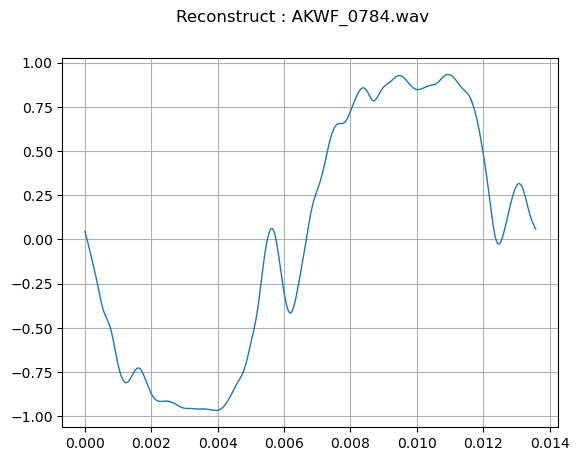

40


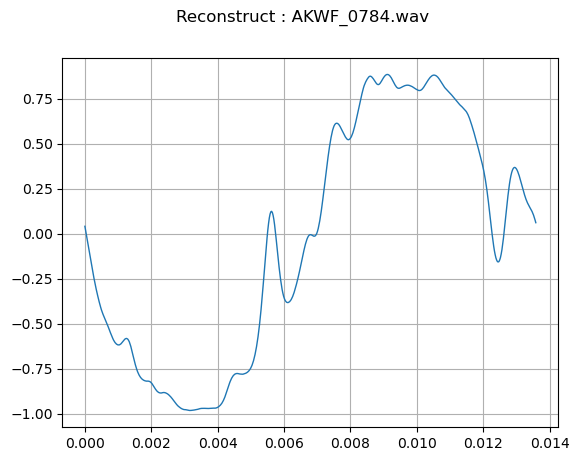

60


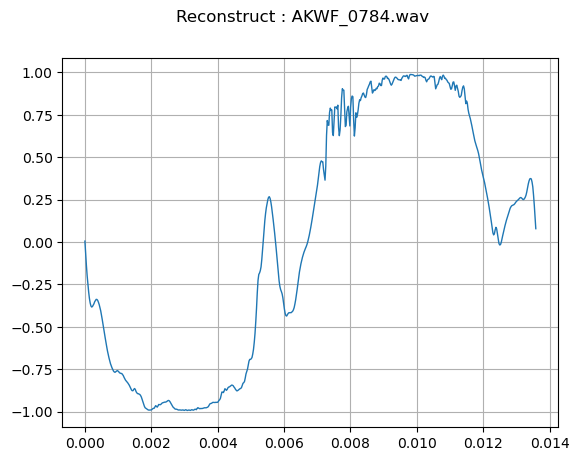

80


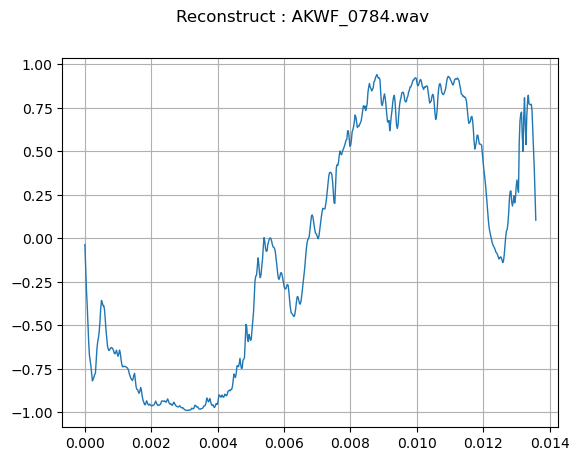

In [168]:
#wavetable, attrs = dm.test_dataset[random.randint(0,len(dm.train_dataset))]
wavetable, attrs = dm.test_dataset[0]
plot_waveform(wavetable, attrs["samplerate"], title="Oridinal : " + attrs["name"])
print("default_brightness",attrs['brightness'])

for i in np.arange(0, 100, 20):
    attrs['brightness'] = i
    #attrs['roughness'] = i
    #attrs['depth'] = i
    _, _, predict_wavetable = model_eval(wavetable.unsqueeze(0),attrs)
    predict_wavetable = predict_wavetable.cpu()
    print(attrs['brightness'])
    plot_waveform(predict_wavetable[0], attrs["samplerate"], title="Reconstruct : " + attrs["name"])
    audio = wavetableSynth(predict_wavetable, sample_rate, duration, frequency, amplitude, start_phase)
    display(Audio(audio, rate=sample_rate))
    

In [ ]:
import numpy as np
from scipy import signal

_, _, predict_wavetable = model_eval(wavetable.unsqueeze(0),attrs)
#han_predict_wavetable = predict_wavetable.cpu() * np.hanning(600)
han_predict_wavetable = predict_wavetable.cpu() * signal.hann(600)

plot_waveform(predict_wavetable[0], attrs["samplerate"], title="Reconstruct : " + attrs["name"])
plot_waveform(han_predict_wavetable[0], attrs["samplerate"], title="Reconstruct+Han : " + attrs["name"])

#audio = wavetableSynth(predict_wavetable, sample_rate, duration, frequency, amplitude, start_phase)
#display(Audio(audio, rate=sample_rate))

In [ ]:
#ちゃんとどのような挙動になっているか確認する

# 波形を6つくっつけてSTFTする
copy_count = 6

#wavetable, attrs = dm.train_dataset[random.randint(0,len(dm.train_dataset))]
wavetable, attrs = dm.train_dataset[0]

#print(wavetable.shape)
plot_waveform(wavetable, attrs["samplerate"])

#wavetable = torch.randn(32,1,600)
#print(len(wavetable[:]))
#batch_size = len(wavetable[:])

#wavetable = wavetable.reshape(batch_size, -1)
# indices for the wavetable values; this is just for `np.interp` to work
wavetable_period = len(wavetable[0,:])

tmp_wavetable = wavetable

for i in range(copy_count-1):
    tmp_wavetable = torch.cat([tmp_wavetable,  wavetable])
    #print(i)
combain_wavetables = tmp_wavetable.reshape(1, -1)
plot_waveform(combain_wavetables, attrs["samplerate"])

print(combain_wavetables.shape)


spec = torchaudio.transforms.Spectrogram(
                                         n_fft = int(wavetable_period*(copy_count)),
                                         hop_length = int(wavetable_period*(copy_count)),
                                         win_length = int(wavetable_period*(copy_count)),
                                         center=False,
                                         pad=0,
                                         window_fn = torch.hann_window,
                                         normalized=True,
                                         onesided=True,
                                         #return_complex = True,
                                         power=2.0)

ToDB = torchaudio.transforms.AmplitudeToDB()


spec_wavetable = ToDB(spec(combain_wavetables).abs())
spec_wavetable =spec_wavetable[0]
print(spec_wavetable.shape)
print(len(spec_wavetable[0]))
#spec_wavetable = spec_wavetable[0,:901,1:-1]
#print(spec_wavetable.shape)

plt.figure(figsize=(16,10))
plt.pcolor(spec_wavetable, cmap=plt.cm.Blues)

In [ ]:
x = torch.randn(1,3600)
duplicate_num = 6

spec =  torchaudio.transforms.Spectrogram(
                                                       #sample_rate = sample_rate,
                                                       n_fft = int(sample_points*(duplicate_num)), #時間幅
                                                       hop_length = int(sample_points*(duplicate_num)), #移動幅
                                                       win_length = int(sample_points*(duplicate_num)), #窓幅
                                                       center=False,
                                                       pad=0, #no_padding
                                                       window_fn = torch.hann_window,
                                                       normalized=True,
                                                       onesided=True,
                                                       power=2.0)

ToDB =  torchaudio.transforms.AmplitudeToDB(stype = 'power',top_db = 80)

spec_x = ToDB(spec(x))
print(spec_x.shape)

In [8]:
import torch

def waveToSpec(waveform: torch.Tensor, sample_points: int, db:bool ):
    spec =  torchaudio.transforms.Spectrogram(
                                                       n_fft = sample_points, #時間幅
                                                       hop_length = sample_points, #移動幅
                                                       win_length = sample_points, #窓幅
                                                       center=False,
                                                       pad=0, #no_padding
                                                       window_fn = torch.hann_window,
                                                       normalized=True,
                                                       onesided=True,
                                                       power=1.0)
        
    ToDB =  torchaudio.transforms.AmplitudeToDB(stype = 'magnitude')#,top_db = 50)
    combain_x = waveform.reshape(1, -1) # [3600] -> [1,3600]
    spec_x = spec(combain_x) # [1,3600] -> [901,1???]
    #print(spec_x.shape)
    if db:
        spec_x = ToDB(spec_x)

    return spec_x

In [6]:
import statistics
import Signal_Analysis.features.signal as signal
import essentia as ess

#インスタンス化
centroid = ess.Centroid()
centralMoments = ess.CentralMoments()
distributionShape = ess.DistributionShape()
zeroCrossingRate = ess.ZeroCrossingRate()
spectrum = ess.Spectrum(size=3600)
powerSpectrum = ess.PowerSpectrum(size=3600)

spectralPeaks = ess.SpectralPeaks()
spectalComplexity = ess.SpectralComplexity()
odd = ess.OddToEvenHarmonicEnergyRatio()
dissonance = ess.Dissonance()
pitchSalience = ess.PitchSalience()

def ytn_audio_exatractor(audio: torch.Tensor, dbFlg:bool):
    
    specDB = waveToSpec(audio,3600,db=True).reshape(-1).numpy()
    spec = waveToSpec(audio,3600,db=False).reshape(-1).numpy()

    if dbFlg:
        c = centroid(specDB)
        sp, _, k = distributionShape(centralMoments(specDB))

        z = zeroCrossingRate(audio)
        sc = spectalComplexity(specDB)
        freq , mag = spectralPeaks(spec)

        o = odd(freq, mag)
        d = dissonance(freq, mag)
        ps = pitchSalience(specDB)
        h = signal.get_HNR(audio, attrs['samplerate'])

    else:
        c = centroid(spec)
        sp, _, k = distributionShape(centralMoments(spec))

        z = zeroCrossingRate(ess_audio)
        sc = spectalComplexity(spec)
        freq , mag = spectralPeaks(spec)

        o = odd(freq, mag)
        d = dissonance(freq, mag)
        ps = pitchSalience(spec)
        h = signal.get_HNR(ess_audio, attrs['samplerate'])

    return c,sp,k,z,sc,o,d,ps,h

ModuleNotFoundError: No module named 'essentia'

In [ ]:
c_min =  0.003175973892211914
c_max =  0.6239917278289795
sp_min =  4.597936276695691e-05
sp_max =  0.18808573484420776
k_min =  -1.8041354417800903
k_max =  13239.8427734375
z_min =  0.0
z_max =  0.9397222399711609
o_min =  2.898063178324861e-10
o_max =  1000.0
ps_min =  2.1121970803505974e-06
ps_max =  0.9996329545974731
h_min =  0
h_max =  81.83601217317359

In [ ]:
def min_max(data, min, max):
    return (data - min) / (max - min)

In [ ]:
#datasetから波形を呼び出し
wavetable, attrs = dm.train_dataset[random.randint(0,len(dm.train_dataset))]

cond_label = []
estimate_label = []

#ラベルを段階的に設定
for i in range(10):
    if i >= 10: break
    else:
        attrs['SpectoralCentroid'] = 0.1*i
        cond_label.append(attrs['SpectoralCentroid'])
        wavetable = wavetable.unsqueeze(0)
        _, _, x = model_eval(x,attrs)
        #波形を6つ繋げる
        six_cycle_wavetable = scw_combain(x,duplicate_num=6)
        #essentiaでの処理
        c,sp,k,z,sc,o,d,ps,h = ytn_audio_exatractor(six_cycle_wavetable,dbFlg=False)

        c = min_max(c,c_min,c_max)
        sp = min_max(sp,sp_min,sp_max)
        k = min_max(k,k_min,k_max)
        z = min_max(z,z_min,z_max)
        o = min_max(o,o_min,o_max)
        ps = min_max(ps,ps_min,ps_max)
        h = min_max(h,h_min,h_max)

        #minmaxの処理を書く
        estimate_label.append(c)
        
#折れ線グラフ表示
plt.plot(cond_label, estimate_label)

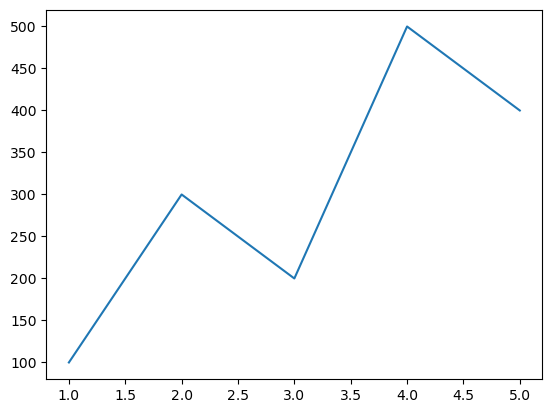

In [1]:
import numpy as np
import matplotlib.pyplot as plt
 
# 折れ線グラフを出力
left = np.array([1, 2, 3, 4, 5])
height = np.array([100, 300, 200, 500, 400])
plt.plot(left, height)